In [1]:
import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import seaborn as sns

In [2]:
DATA_PATH = 'g-research-crypto-forecasting/'
TRAIN_PATH = DATA_PATH + 'train.csv'
ASSETS_PATH = DATA_PATH + 'asset_details.csv'

In [3]:
train = pd.read_csv(TRAIN_PATH, 
                       dtype={'Asset_ID': 'int8', 'Count': 'int32', 'row_id': 'int32', 'Count': 'int32', 
                              'Open': 'float64', 'High': 'float64', 'Low': 'float64', 'Close': 'float64', 
                              'Volume': 'float64', 'VWAP': 'float64'
                             }
                      )
train.head(3)

,timestamp,Asset_ID,Count,Open,High,Low,Close,Volume,VWAP,Target
0,1514764860,2,40,2376.580,2399.50,2357.14,2374.590,19.233005,2373.116392,-0.004218
1,1514764860,0,5,8.530,8.53,8.53,8.530,78.380000,8.530000,-0.014399
2,1514764860,1,229,13835.194,14013.80,13666.11,13850.176,31.550062,13827.062093,-0.014643


In [4]:
asset_details = pd.read_csv(ASSETS_PATH,
                           dtype={'Asset_ID':'int8','Weight':'float64','Asset_name':'str'})
asset_details['Ticker']=['bch', 'bnb', 'btc', 'eos', 'etc', 'eth', 'ltc', 'mnr', 'trx', 'xlm', 'ada', 'miota', 'mkr', 'doge']
asset_details.head(3)

,Asset_ID,Weight,Asset_Name,Ticker
0,2,2.397895,Bitcoin Cash,bch
1,0,4.304065,Binance Coin,bnb
2,1,6.779922,Bitcoin,btc


In [5]:
asset_details.dtypes

Asset_ID         int8
Weight        float64
Asset_Name     object
Ticker         object
dtype: object

In [6]:
asset_details.sort_values(by=['Weight'],ascending=False,inplace=True)
# df[percent] = (df['column_name'] / df['column_name'].sum()) * 100
asset_details['coinWeightPercent'] = (asset_details['Weight'] / asset_details['Weight'].sum()) * 100
asset_details

,Asset_ID,Weight,Asset_Name,Ticker,coinWeightPercent
2,1,6.779922,Bitcoin,btc,16.584998
5,6,5.894403,Ethereum,eth,14.418848
10,3,4.406719,Cardano,ada,10.779686
1,0,4.304065,Binance Coin,bnb,10.528574
13,4,3.555348,Dogecoin,doge,8.697068
0,2,2.397895,Bitcoin Cash,bch,5.865715
6,9,2.397895,Litecoin,ltc,5.865715
4,7,2.079442,Ethereum Classic,etc,5.086716
9,12,2.079442,Stellar,xlm,5.086716
8,13,1.791759,TRON,trx,4.382990


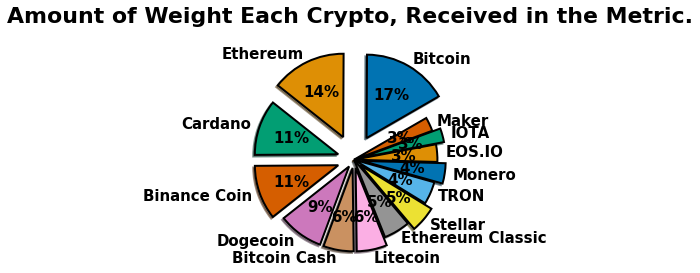

In [7]:
fig = plt.figure()
ax = plt.gca()
box = ax.get_position()
ax.set_position([box.x0, box.y0, box.width , box.height ])
colors = sns.color_palette('colorblind')[0:14]
labels = ['Bitcoin', 'Ethereum', 'Cardano', 'Binance Coin', 'Dogecoin', 'Bitcoin Cash', 'Litecoin', 'Ethereum Classic',
          'Stellar', 'TRON', 'Monero', 'EOS.IO', 'IOTA', 'Maker']
explode = (0.3, 0.3, 0.2, 0.2, 0.1, 0.1, 0.1, 0.0, 0.1, 0.0, 0.1, 0.0, 0.1, 0.0)
plt.pie(asset_details['coinWeightPercent'], colors=colors, autopct='%.0f%%', labels=labels, explode=explode,
        startangle=30, shadow=True, textprops={'fontweight': 'semibold', 'fontsize': 15},
        wedgeprops={'linewidth': 2, 'edgecolor': 'k'}, labeldistance=1.1)
plt.title("Amount of Weight Each Crypto, Received in the Metric.", fontweight="bold", fontsize=22, pad=21)
plt.axis('equal')
plt.show()

In [8]:
data = pd.merge(train, asset_details, on="Asset_ID")

In [9]:
dic_tickers = {}
for i in range(14):
    dic_tickers[data[data['Asset_ID']==i]['Ticker'].values[0]] = data[data["Asset_ID"]==i].set_index("timestamp") 

In [10]:
dic_tickers

{'bnb':             Asset_ID  Count      Open      High       Low     Close  \
 timestamp                                                             
 1514764860         0      5    8.5300    8.5300    8.5300    8.5300   
 1514764920         0      7    8.5300    8.5300    8.5145    8.5145   
 1514764980         0     45    8.5065    8.5299    8.4848    8.4848   
 1514765040         0     14    8.5009    8.5066    8.4744    8.5009   
 1514765100         0      5    8.5007    8.5007    8.4560    8.4560   
 ...              ...    ...       ...       ...       ...       ...   
 1632182160         0    277  364.1115  364.2000  362.7000  362.9180   
 1632182220         0    296  362.9265  363.2000  362.1000  362.2000   
 1632182280         0    319  362.2310  362.4000  361.7000  361.8580   
 1632182340         0    588  362.0120  364.3000  361.8000  364.1145   
 1632182400         0    429  364.1150  364.5000  363.7000  363.7575   
 
                  Volume        VWAP    Target    Weigh

In [11]:
btc = data[data['Asset_Name']=='Bitcoin'].set_index('timestamp')
bch = data[data['Asset_Name']=='Bitcoin Cash'].set_index('timestamp')
bnb = data[data['Asset_Name']=='Binance Coin'].set_index('timestamp')
eos = data[data['Asset_Name']=='EOS.IO'].set_index('timestamp')
etc = data[data['Asset_Name']=='Ethereum Classic'].set_index('timestamp')
eth = data[data['Asset_Name']=='Ethereum'].set_index('timestamp')
ltc = data[data['Asset_Name']=='Litecoin'].set_index('timestamp')
mnr = data[data['Asset_Name']=='Monero'].set_index('timestamp')
trx = data[data['Asset_Name']=='TRON'].set_index('timestamp')
xlm = data[data['Asset_Name']=='Stellar'].set_index('timestamp')
ada = data[data['Asset_Name']=='Cardano'].set_index('timestamp')
miota = data[data['Asset_Name']=='IOTA'].set_index('timestamp')
mkr = data[data['Asset_Name']=='Maker'].set_index('timestamp')
doge = data[data['Asset_Name']=='Dogecoin'].set_index('timestamp')

In [12]:
btc.head(3)

,Asset_ID,Count,Open,High,Low,Close,Volume,VWAP,Target,Weight,Asset_Name,Ticker,coinWeightPercent
timestamp,,,,,,,,,,,,,
1514764860,1,229,13835.194,14013.8,13666.11,13850.176,31.550062,13827.062093,-0.014643,6.779922,Bitcoin,btc,16.584998
1514764920,1,235,13835.036,14052.3,13680.00,13828.102,31.046432,13840.362591,-0.015037,6.779922,Bitcoin,btc,16.584998
1514764980,1,528,13823.900,14000.4,13601.00,13801.314,55.061820,13806.068014,-0.010309,6.779922,Bitcoin,btc,16.584998


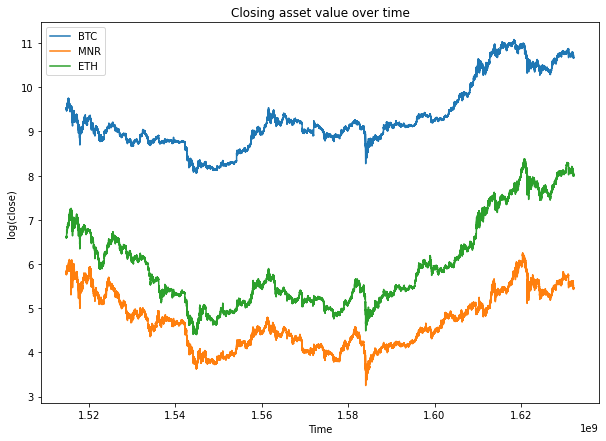

In [13]:
# log of Close values is chosen because of the different price scales
f = plt.figure(figsize=(10,7))
plt.plot(np.log(btc['Close']), label='BTC');
plt.plot(np.log(mnr['Close']), label='MNR');
plt.plot(np.log(eth['Close']), label='ETH');
plt.title('Closing asset value over time');
plt.xlabel('Time');
plt.ylabel('log(close)');
plt.legend();

In [14]:
def plt_asset(name, timeframe):
    mini = name.iloc[-timeframe:]
    fig = go.Figure(data=[go.Candlestick(x=mini.index, open=mini['Open'], high=mini['High'], low=mini['Low'], close=mini['Close'])])
    fig.update_xaxes(title_text="dollar $ value")
    fig.update_yaxes(title_text="Index")
    fig.update_layout(title=i +" Price,"+ str(timeframe) + " Last Minutes")
    fig.show()

In [15]:
timeframe = 100 #100 minutes
for i in dic_tickers:
    plt_asset(dic_tickers[i], timeframe)

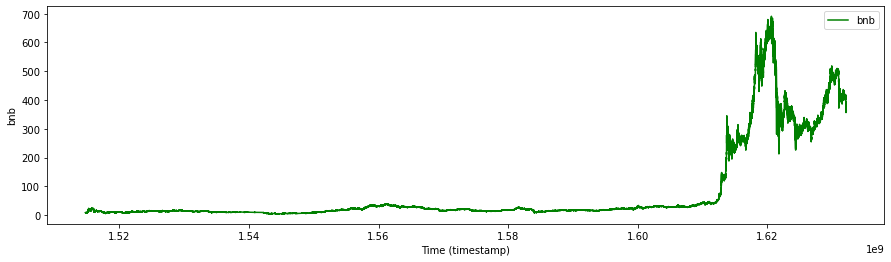

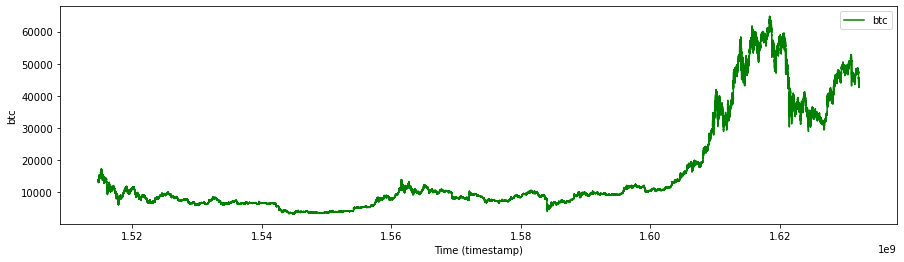

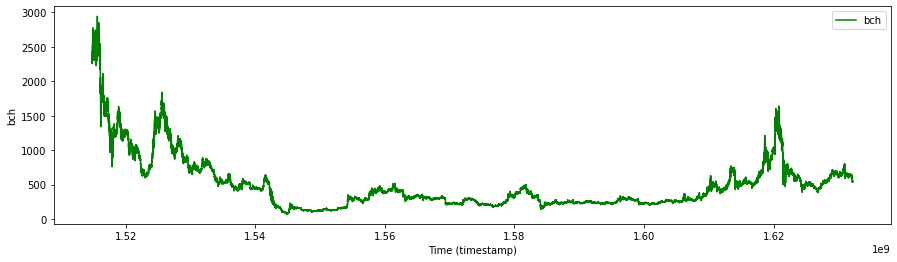

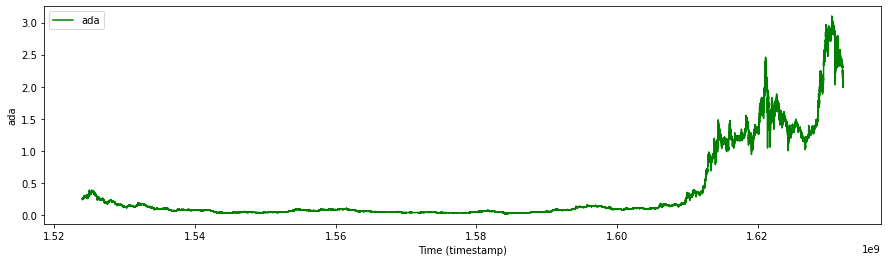

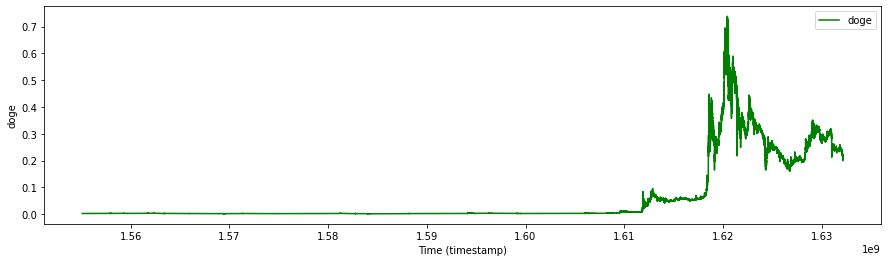

...

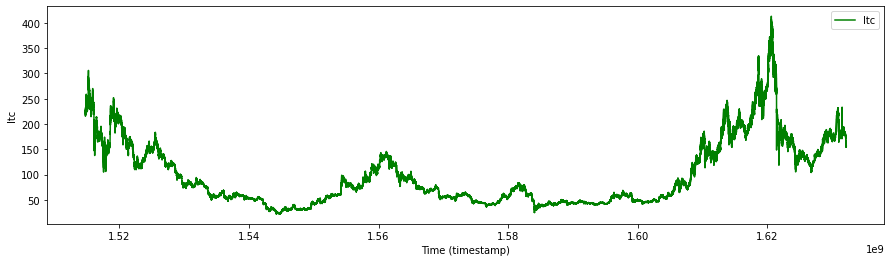

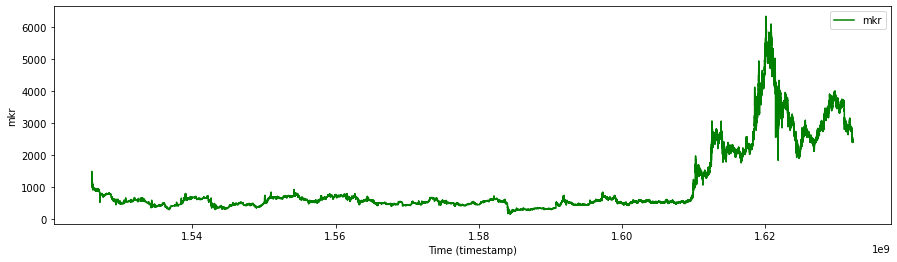

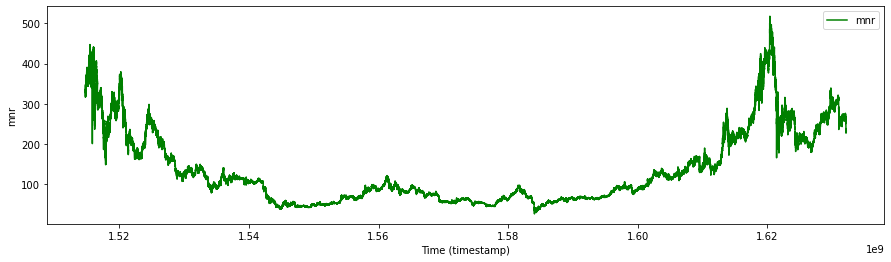

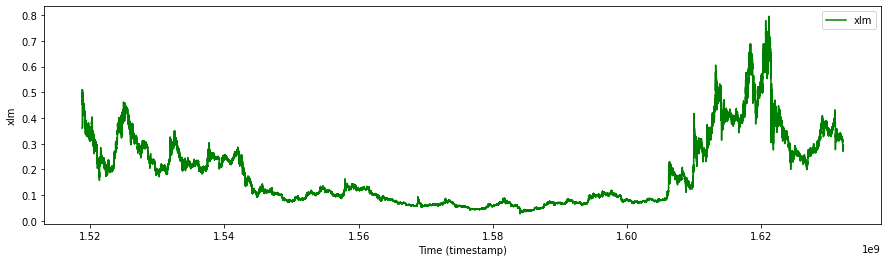

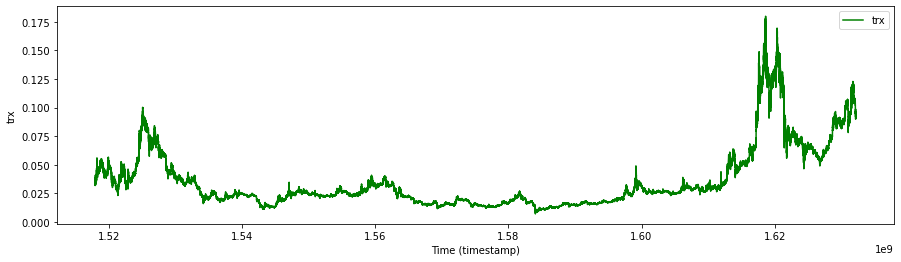

In [16]:
for i in dic_tickers: 
    plt.figure(figsize=(15,4))
    dic_tickers[i] = dic_tickers[i].reindex(range(dic_tickers[i].index[0],dic_tickers[i].index[-1]+60,60),method='pad')
    plt.plot(dic_tickers[i]['Close'], color='green', label=i)
    plt.legend()
    plt.xlabel('Time (timestamp)')
    plt.ylabel(i)
    plt.show()

In [17]:
import xgboost as xgb

# Two new features from the competition tutorial
def upper_shadow(df):
    return df['High'] - np.maximum(df['Close'], df['Open'])

def lower_shadow(df):
    return np.minimum(df['Close'], df['Open']) - df['Low']

def log_return(series, periods=1):
    return np.log(series).diff(periods=periods)

def delta_change(series, periods=1):
    return series.diff(periods=periods)

def SMA(col, period):
    return col.rolling(period).mean()

def EMA(col, period):
    return col.ewm(span=period).mean()

# A utility function to build features from the original df
# It works for rows to, so we can reutilize it.
def get_features(df):
    df_feat = df[['Close', 'Volume']].copy()
    #df_feat = df[['Count', 'Open', 'High', 'Low', 'Close', 'Volume', 'VWAP']].copy()
    #df_feat['Upper_Shadow'] = upper_shadow(df_feat)
    #df_feat['Lower_Shadow'] = lower_shadow(df_feat)
    
    #df_feat["Close/Open"] = df_feat["Close"] / df_feat["Open"] 
    #df_feat["Close-Open"] = df_feat["Close"] - df_feat["Open"] 
    #df_feat["High-Low"] = df_feat["High"] - df_feat["Low"] 
    #df_feat["High/Low"] = df_feat["High"] / df_feat["Low"]
    
    #df_feat['Mean'] = df_feat[['Open', 'High', 'Low', 'Close']].mean(axis=1)

    #df_feat["Median"] = df_feat[["Open", "High", "Low", "Close"]].median(axis=1)

    return df_feat

In [18]:
t = get_features(data[data["Asset_ID"] == 1])
t
                          

,Close,Volume
3896156,13850.176000,31.550062
3896157,13828.102000,31.046432
3896158,13801.314000,55.061820
3896159,13768.040000,38.780529
3896160,13724.914000,108.501637
...,...,...
5852433,42899.012857,56.850913
5852434,42860.005714,80.993326
5852435,42827.020000,65.677734
5852436,43017.277143,138.335477


In [19]:
import xgboost as xgb
from xgboost.sklearn import XGBRegressor
from sklearn.model_selection import GridSearchCV
def get_Xy_and_model_for_asset(df_train, asset_id):
    df = df_train[df_train["Asset_ID"] == asset_id]
    
    # TODO: Try different features here!
    df_proc = get_features(df)
    df_proc['y'] = df['Target']
    df_proc = df_proc.dropna(how="any")
    
    X = df_proc.drop("y", axis=1)
    y = df_proc["y"]

    ''''
    best :
    colsample_bytree': 0.7, 'learning_rate': 0.03, 'max_depth': 1, 'min_child_weight': 4, 'n_estimators': 300, 'nthread': 4, 'objective': 'reg:squarederror', 'subsample': 0.9

    full test :

    '''
    params_xgb = {'nthread':[4], #when use hyperthread, xgboost may become slower
                  'objective':['reg:squarederror'],
                  'learning_rate': [.03, 0.05], #so called `eta` value
                  'max_depth': [1,3,5,7,10],
                  'min_child_weight': [4],
                  'subsample': [0.7,.9],
                  'colsample_bytree': [0.7,0.9],
                  'n_estimators': [150,300,500]
                 }
    
    xgb = XGBRegressor(tree_method='gpu_hist', predictor='gpu_predictor')
    model = GridSearchCV(
        xgb,
        param_grid=params_xgb,
        n_jobs=4,
        scoring = 'neg_mean_squared_error',
        cv=2,
        verbose=10)

    '''
    model = xgb.XGBRegressor(
            n_estimators=500,
            max_depth=11,
            learning_rate=0.05,
            subsample=0.9,
            colsample_bytree=0.7,
            missing=-999,
            random_state=2020,
            # tree_method='gpu_hist'  # THE MAGICAL PARAMETER
        )
    '''
    model.fit(X[:7000], y[:7000])
    print (model.best_params_, model.best_score_)
    return X, y, model



In [20]:
%%time 
X, y, model = get_Xy_and_model_for_asset(data, 1)

Fitting 2 folds for each of 120 candidates, totalling 240 fits
{'colsample_bytree': 0.7, 'learning_rate': 0.05, 'max_depth': 1, 'min_child_weight': 4, 'n_estimators': 150, 'nthread': 4, 'objective': 'reg:squarederror', 'subsample': 0.9} -3.572632873167921e-05
Wall time: 2min 36s


In [21]:
print(model.best_estimator_.feature_importances_)

[0.66254145 0.3374586 ]


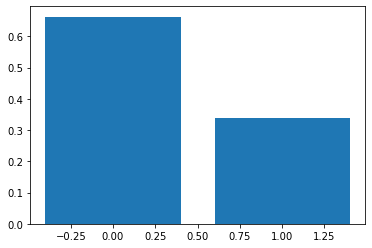

In [22]:
from matplotlib import pyplot
pyplot.bar(range(len(model.best_estimator_.feature_importances_)), model.best_estimator_.feature_importances_)
pyplot.show()

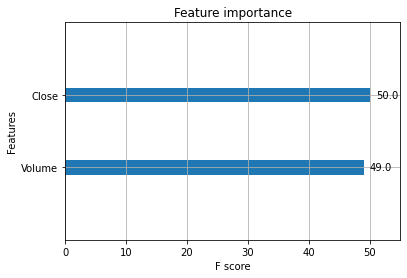

In [23]:
from xgboost import plot_importance
plot_importance(model.best_estimator_)
pyplot.show()

In [24]:
Xs = {}
ys = {}
models = {}

for asset_id, asset_name in zip(asset_details['Asset_ID'], asset_details['Asset_Name']):
    print(f"Training model for {asset_name:<16} (ID={asset_id:<2})")
    try:
        X, y, model = get_Xy_and_model_for_asset(dic_tickers, asset_id)    
        Xs[asset_id], ys[asset_id], models[asset_id] = X, y, model
    except:         
        Xs[asset_id], ys[asset_id], models[asset_id] = None, None, None    



Training model for Bitcoin          (ID=1 )
Training model for Ethereum         (ID=6 )
Training model for Cardano          (ID=3 )
Training model for Binance Coin     (ID=0 )
Training model for Dogecoin         (ID=4 )
Training model for Bitcoin Cash     (ID=2 )
Training model for Litecoin         (ID=9 )
Training model for Ethereum Classic (ID=7 )
Training model for Stellar          (ID=12)
Training model for TRON             (ID=13)
Training model for Monero           (ID=11)
Training model for EOS.IO           (ID=5 )
Training model for IOTA             (ID=8 )
Training model for Maker            (ID=10)


In [25]:


# Check the model interface
x = get_features(df_train.iloc[1])
y_pred = models[0].predict(pd.DataFrame([x]))
y_pred[0]



NameError: name 'df_train' is not defined

In [ ]:


env = gresearch_crypto.make_env()
iter_test = env.iter_test()

for i, (df_test, df_pred) in enumerate(iter_test):
    for j , row in df_test.iterrows():        
        if models[row['Asset_ID']] is not None:
            try:
                model = models[row['Asset_ID']]
                x_test = get_features(row)
                y_pred = model.predict(pd.DataFrame([x_test]))[0]
                df_pred.loc[df_pred['row_id'] == row['row_id'], 'Target'] = y_pred
            except:
                df_pred.loc[df_pred['row_id'] == row['row_id'], 'Target'] = 0
                traceback.print_exc()
        else: 
            df_pred.loc[df_pred['row_id'] == row['row_id'], 'Target'] = 0        
    env.predict(df_pred)



## ARIMA

In [26]:
from statsmodels.tsa.seasonal import seasonal_decompose

In [27]:
def crypto_sub(asset_id ,data= train ):
    df = data[data["Asset_ID"]==asset_id].reset_index(drop = True)
    df['timestamp'] = pd.to_datetime(df['timestamp'], unit='s')
    df = df.set_index('timestamp')
    return df

def mini_data(data):
    df=data[["Close","Low","High","Open","Volume","VWAP"]]
    return df



In [28]:
btc = crypto_sub(1)

In [29]:
btc_mini = mini_data(btc)
btc_mini.head()

,Close,Low,High,Open,Volume,VWAP
timestamp,,,,,,
2018-01-01 00:01:00,13850.176,13666.11,14013.8,13835.194,31.550062,13827.062093
2018-01-01 00:02:00,13828.102,13680.00,14052.3,13835.036,31.046432,13840.362591
2018-01-01 00:03:00,13801.314,13601.00,14000.4,13823.900,55.061820,13806.068014
2018-01-01 00:04:00,13768.040,13576.28,13999.0,13802.512,38.780529,13783.598101
2018-01-01 00:05:00,13724.914,13554.44,13955.9,13766.000,108.501637,13735.586842


In [30]:
btc_15T = btc_mini.resample('15T').mean()

In [31]:
btc_15T.head(5)

,Close,Low,High,Open,Volume,VWAP
timestamp,,,,,,
2018-01-01 00:00:00,13736.713714,13538.075714,13961.635714,13742.803571,53.141624,13735.342219
2018-01-01 00:15:00,13626.749800,13438.346667,13785.974667,13630.148867,55.342116,13626.671953
2018-01-01 00:30:00,13643.495200,13485.665333,13778.086000,13644.581933,35.820927,13641.840770
2018-01-01 00:45:00,13657.183867,13505.080667,13822.446667,13656.295467,53.411304,13654.216445
2018-01-01 01:00:00,13597.235480,13463.652667,13750.500000,13602.091400,26.268630,13594.446519


#### 1. Seasonal Decomposition

BTC Seasonal Decomposition


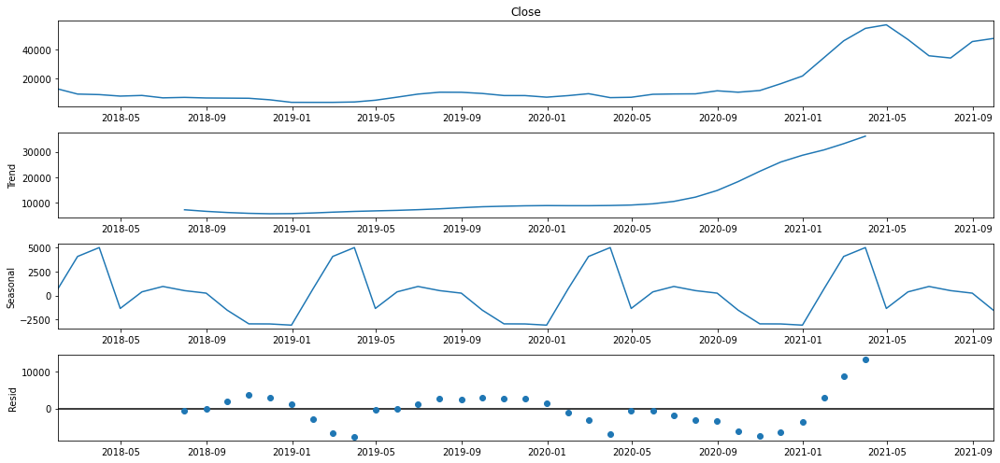

In [32]:
#function to plot
plt.rcParams["figure.figsize"]=(15,7)

def season_df(data,label):
    df = data.resample('M').mean()
    seasonal_decompose(df.Close).plot()
    print(label)
    return plt.show()

season_df(btc, "BTC Seasonal Decomposition")

In [33]:
def T15_df(data,label):
    df = data.resample('15T').mean()
    seasonal_decompose(df.Close).plot()
    seasonal_decompose(df.Volume).plot()
    seasonal_decompose(df.VWAP).plot()
    print(label)
    return plt.show()

#GERER LES MISSING VALUES

#### 2. Box-Cox Transformation

In [34]:
from scipy import stats

In [35]:
btc_month = btc_mini.resample('M').mean()

In [36]:
btc_month["close_box"], lmbda=stats.boxcox(btc_month.Close)

In [37]:
btc_month.head(5)

,Close,Low,High,Open,Volume,VWAP,close_box
timestamp,,,,,,,
2018-01-31,12874.810724,12751.805421,12989.816938,12874.884156,84.167676,12874.491409,1.894840
2018-02-28,9388.844620,9344.355702,9432.012839,9388.874980,126.867665,9388.632743,1.892430
2018-03-31,9021.126575,8998.275299,9043.604534,9021.211682,110.612088,9021.045738,1.892095
2018-04-30,7982.553371,7967.458385,7997.767966,7982.527303,86.354450,7982.475869,1.891027
2018-05-31,8439.249120,8421.650896,8459.314396,8439.311957,61.530470,8439.159487,1.891521


In [38]:
from itertools import product
import warnings
from statsmodels.tsa.statespace.sarimax import SARIMAX

qs = range(0, 3)
ps = range(0, 3)
d=1
parameters = product(ps, qs)
parameters_list = list(parameters)
len(parameters_list)

# Model Selection
results = []
best_aic = float("inf")
warnings.filterwarnings('ignore')
for param in parameters_list:
    try:
        model = SARIMAX(btc_month.close_box, order=(param[0], d, param[1])).fit(disp=-1)
    except ValueError:
        print('bad parameter combination:', param)
        continue
    aic = model.aic
    if aic < best_aic:
        best_model = model
        best_aic = aic
        best_param = param
    results.append([param, model.aic])

In [39]:
result_table = pd.DataFrame(results)
result_table.columns = ['parameters', 'aic']
print(result_table.sort_values(by = 'aic', ascending=True).head())
print(best_model.summary())

  parameters         aic
3     (1, 0) -446.108787
1     (0, 1) -445.320413
6     (2, 0) -444.145536
4     (1, 1) -444.129764
2     (0, 2) -442.735719
                               SARIMAX Results                                
Dep. Variable:              close_box   No. Observations:                   45
Model:               SARIMAX(1, 1, 0)   Log Likelihood                 225.054
Date:                Wed, 02 Feb 2022   AIC                           -446.109
Time:                        14:08:31   BIC                           -442.540
Sample:                    01-31-2018   HQIC                          -444.785
                         - 09-30-2021                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.3821      0.133      2.874      0.004      

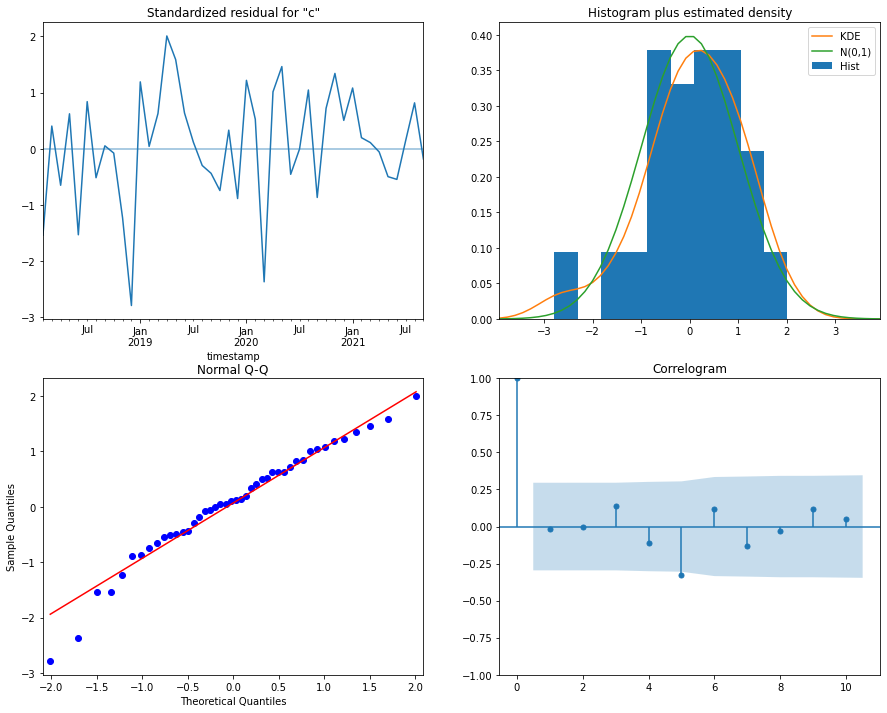

In [40]:
best_model.plot_diagnostics(figsize=(15, 12))
plt.show()

In [41]:
def invboxcox(y,lmbda):
    if lmbda == 0:
        return(np.exp(y))
    else:
        return(np.exp(np.log(lmbda*y+1)/lmbda))

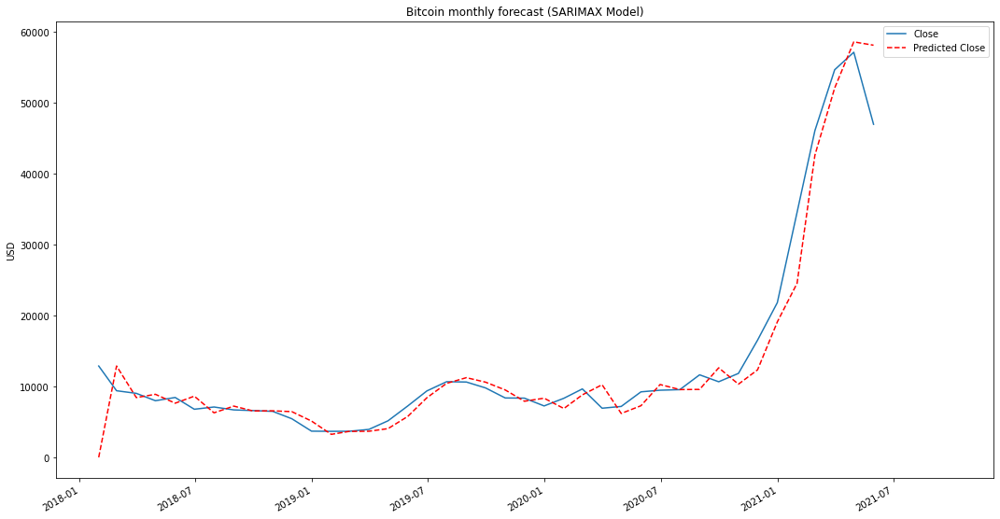

In [42]:
from datetime import datetime
# Prediction
btc_month_pred = btc_month[['Close']]
date_list = [datetime(2021, 6, 20), datetime(2021, 7, 20), datetime(2021, 8, 21), datetime(2021, 9, 21)]
future = pd.DataFrame(index=date_list, columns= btc_month.columns)
btc_month_pred = pd.concat([btc_month_pred, future])
btc_month_pred['forecast'] = invboxcox(best_model.predict(start=datetime(2018, 1, 31), end=datetime(2021, 5, 31)), lmbda)
plt.figure(figsize=(18,10))
btc_month_pred.Close.plot()
btc_month_pred.forecast.plot(color='r', ls='--', label='Predicted Close')
plt.legend()
plt.title('Bitcoin monthly forecast (SARIMAX Model)')
plt.ylabel('USD')
plt.show()

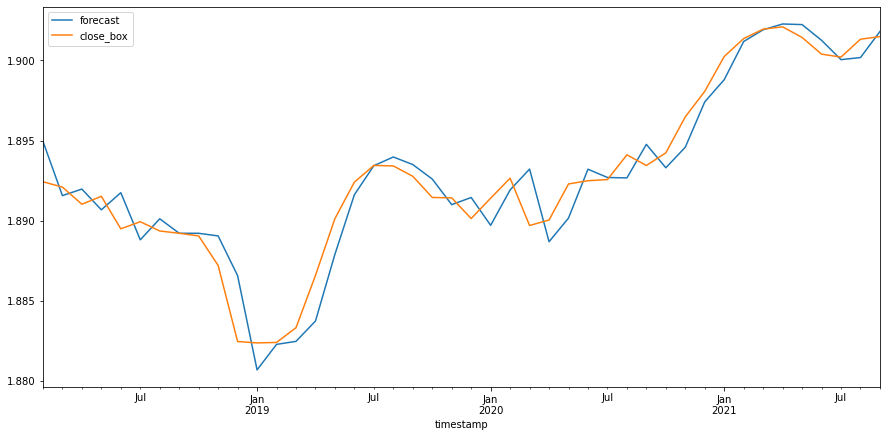

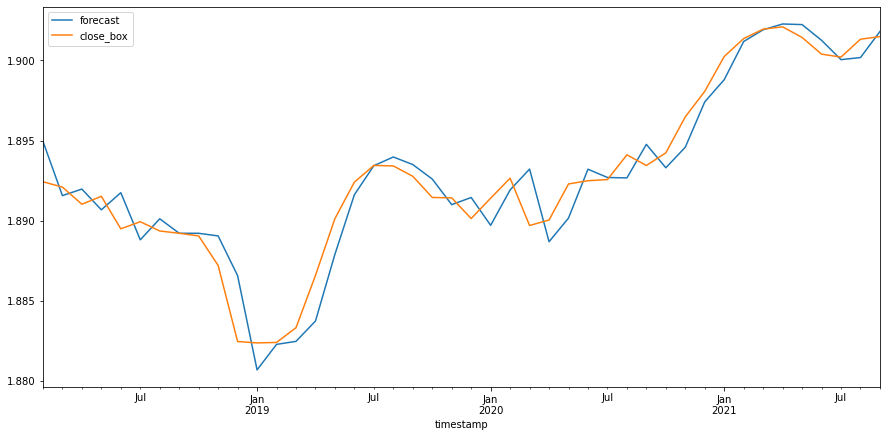

In [43]:
# ARIMA model
from statsmodels.tsa.arima_model import ARIMA
model = ARIMA(btc_month[['close_box']],order=(1,1,1))
arima_result = model.fit()
arima_result.summary()
arima_result.plot_predict()

## Recurrent Neural Network | LSTM

In [580]:
# Importing the libraries
import numpy as np
import matplotlib.pyplot as plt
plt.style.use('fivethirtyeight')
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
from keras.models import Sequential
from keras.layers import Dense, LSTM, Dropout, GRU, Bidirectional
import tensorflow as tf
import math
from sklearn.metrics import mean_squared_error

In [614]:
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots

# Some functions to help out with
def plot_predictions(test,predicted):
    fig = px.line(x=test.index(), y="Close")
    #fig.add_trace(px.line(predicted))
    fig.show()

def return_rmse(test,predicted):
    rmse = math.sqrt(mean_squared_error(test, predicted))
    print("The root mean squared error is {}.".format(rmse))

In [615]:
dataset = btc.resample('D').mean()

In [616]:
dataset['close_log_return'] = log_return(dataset['Close'])

In [617]:
dataset = dataset.dropna(axis = 0)
dataset

,Asset_ID,Count,Open,High,Low,Close,Volume,VWAP,Target,close_log_return
timestamp,,,,,,,,,,
2018-01-02,1.0,399.002778,13883.789249,14015.528806,13777.035714,13885.451885,73.278080,13884.647667,0.000947,0.032573
2018-01-03,1.0,359.888194,14968.022297,15108.091903,14830.351979,14968.705857,58.219473,14967.995581,-0.000085,0.075120
2018-01-04,1.0,393.017361,14820.063520,14956.625431,14685.640812,14820.753062,70.230390,14820.249468,0.000067,-0.009933
2018-01-05,1.0,413.500000,15826.389955,15948.539135,15739.348365,15828.013939,75.490973,15826.890326,0.000286,0.065753
2018-01-06,1.0,325.392361,16666.407196,16725.749500,16596.485944,16666.883321,48.207011,16666.426668,-0.000388,0.051642
...,...,...,...,...,...,...,...,...,...,...
2021-09-16,1.0,1654.457639,47895.193153,47930.835155,47857.977785,47894.959776,54.132501,47893.733790,0.000081,0.006656
2021-09-17,1.0,1475.852083,47577.312015,47610.546289,47542.758347,47576.980546,44.817177,47576.337563,0.000079,-0.006661
2021-09-18,1.0,1270.891667,48232.961669,48262.519151,48204.163156,48233.558703,39.215038,48233.218091,0.000125,0.013706


In [618]:
import plotly.offline as pyo
import plotly.graph_objs as go
# Set notebook mode to work in offline
pyo.init_notebook_mode()
# Visualizing the results for LSTM
fig = go.Figure()
fig.add_trace(go.Scatter(x=dataset.index, y=dataset.close_log_return,
                    mode='lines',
                    name='BTC Close logreturn'))

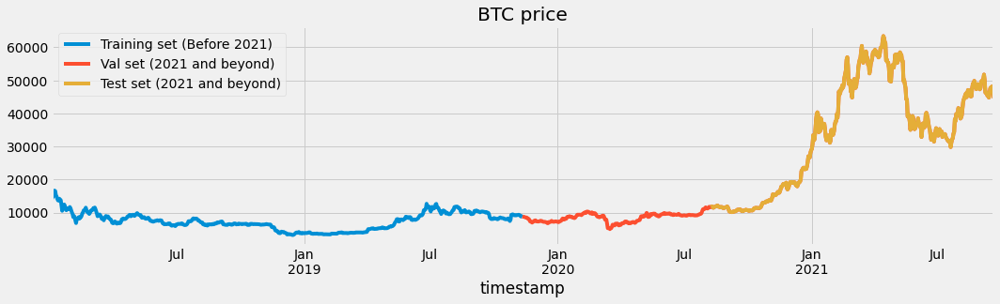

In [619]:
# We have chosen 'High' attribute for prices. Let's see what it looks like
dataset["Close"][:'2019-11-11'].plot(figsize=(16,4),legend=True)
dataset["Close"]['2019-11-11':].plot(figsize=(16,4),legend=True)
dataset["Close"]['2020-08-09':].plot(figsize=(16,4),legend=True)
plt.legend(['Training set (Before 2021)','Val set (2021 and beyond)','Test set (2021 and beyond)'])
plt.title('BTC price')
plt.show()

In [620]:
# Checking for missing values
training_set = dataset[:'2020-08-09'].iloc[:,5:6].values
#val_set = dataset['2019-11-11':'2020-08-09'].iloc[:,5:6].values
test_set = dataset['2020-08-09':].iloc[:,5:6].values

In [621]:
training_set.shape

(951, 1)

In [622]:
# Scaling the training set
sc = MinMaxScaler(feature_range=(0,1))
training_set_scaled = sc.fit_transform(training_set)

In [623]:
history_points = 60


In [624]:
test_set.shape

(408, 1)

In [625]:
training_set_scaled.shape

(951, 1)

In [626]:
# Since LSTMs store long term memory state, we create a data structure with 60 timesteps and 1 output
# So for each element of training set, we have 60 previous training set elements 
X_train = []
y_train = []
for i in range(history_points,training_set.shape[0]):
    X_train.append(training_set_scaled[i-history_points:i,0])
    y_train.append(training_set_scaled[i,0])
X_train, y_train = np.array(X_train), np.array(y_train)

In [627]:
X_train.shape, y_train.shape

((891, 60), (891,))

In [628]:
# Reshaping X_train for efficient modelling
X_train = np.reshape(X_train, (X_train.shape[0],X_train.shape[1],1))

In [629]:
X_train.shape

(891, 60, 1)

In [630]:
X_train

array([[[0.79334741],
        [0.87383016],
        [0.86283768],
        ...,
        [0.55085322],
        [0.55296187],
        [0.57763874]],

       [[0.87383016],
        [0.86283768],
        [0.93767435],
        ...,
        [0.55296187],
        [0.57763874],
        [0.60535944]],

       [[0.86283768],
        [0.93767435],
        [1.        ],
        ...,
        [0.57763874],
        [0.60535944],
        [0.59764891]],

       ...,

       [[0.4840513 ],
        [0.48310263],
        [0.48870697],
        ...,
        [0.59679263],
        [0.61311289],
        [0.63454359]],

       [[0.48310263],
        [0.48870697],
        [0.47839161],
        ...,
        [0.61311289],
        [0.63454359],
        [0.63166279]],

       [[0.48870697],
        [0.47839161],
        [0.46122989],
        ...,
        [0.63454359],
        [0.63166279],
        [0.62930939]]])

In [631]:
np.random.seed(7)

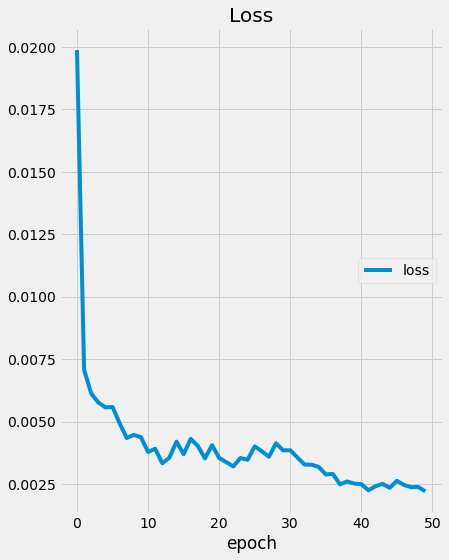

Loss
	loss             	 (min:    0.002, max:    0.020, cur:    0.002)
28/28 [==============================] - 0s 13ms/step - loss: 0.0022


In [632]:
from keras.callbacks import ModelCheckpoint
from livelossplot import PlotLossesKeras

# The LSTM architecture
regressor = Sequential()

# First LSTM layer with Dropout regularisation
regressor.add(LSTM(units=32, return_sequences=True, input_shape=(X_train.shape[1],1)))
regressor.add(Dropout(0.3))
# Fifth LSTM layer
regressor.add(LSTM(units=32, return_sequences=False))
regressor.add(Dropout(0.3))
# The output layer
regressor.add(Dense(units=1))

# Compiling the RNN
regressor.compile(optimizer='adam',loss='mean_squared_error')
filepath = "model.h5"
plotloss_cb = PlotLossesKeras()
checkpoint = ModelCheckpoint(filepath, monitor="loss", verbose=2, save_best_only=True, mode='min')
callbacks_list = [checkpoint, plotloss_cb]
# Fitting to the training set
regressor.fit(X_train,y_train,epochs=50,batch_size=32, callbacks=callbacks_list, shuffle = False,)

In [633]:
checkpoint.best

0.0022134853061288595

In [634]:
test_set

array([[11667.46640886],
       [11892.30462142],
       [11630.24712695],
       [11460.07411107],
       [11546.58524587],
       [11748.09987647],
       [11875.08101414],
       [11851.39231892],
       [12052.58930684],
       [12163.26240763],
       [11797.56183487],
       [11797.43390325],
       [11745.04664962],
       [11559.53495721],
       [11621.36308175],
       [11734.8903216 ],
       [11510.02392192],
       [11403.56368374],
       [11346.77150207],
       [11440.71946328],
       [11506.70906098],
       [11611.26985743],
       [11684.92213581],
       [11871.45207203],
       [11575.9468539 ],
       [11037.24704242],
       [10389.83162905],
       [10272.87765308],
       [10204.32975994],
       [10163.46525601],
       [10149.55544101],
       [10188.07214079],
       [10338.54063496],
       [10302.64730663],
       [10373.08779414],
       [10396.10483763],
       [10509.32230894],
       [10774.49807923],
       [10896.12448779],
       [10893.79959604],


In [635]:
# Now to get the test set ready in a similar way as the training set.
# The following has been done so forst 60 entires of test set have 60 previous values which is impossible to get unless we take the whole 
# 'High' attribute data for processing
dataset_total = pd.concat((dataset['Close'][:'2020-08-09'],dataset['Close']['2020-08-10':]),axis=0)
inputs = dataset_total[len(dataset_total)-len(test_set)-history_points:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

In [636]:
inputs.shape

(468, 1)

In [637]:
# Preparing X_test and predicting the prices
X_test = []
for i in range(history_points,inputs.shape[0]):
    X_test.append(inputs[i-history_points:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))
predicted = regressor.predict(X_test)
predicted.shape
predicted = sc.inverse_transform(predicted)

In [638]:
X_test.shape, predicted.shape, test_set.shape

((408, 60, 1), (408, 1), (408, 1))

In [639]:
X_test

array([[[0.48870697],
        [0.47839161],
        [0.46122989],
        ...,
        [0.63454359],
        [0.63166279],
        [0.62930939]],

       [[0.47839161],
        [0.46122989],
        [0.46217031],
        ...,
        [0.63166279],
        [0.62930939],
        [0.62855729]],

       [[0.46122989],
        [0.46217031],
        [0.46064311],
        ...,
        [0.62930939],
        [0.62855729],
        [0.64526214]],

       ...,

       [[1.97848127],
        [2.07926807],
        [2.14906464],
        ...,
        [3.29655312],
        [3.32015885],
        [3.29653388]],

       [[2.07926807],
        [2.14906464],
        [2.1753021 ],
        ...,
        [3.32015885],
        [3.29653388],
        [3.34531581]],

       [[2.14906464],
        [2.1753021 ],
        [2.27788541],
        ...,
        [3.29653388],
        [3.34531581],
        [3.30762765]]])

In [640]:
predicted = pd.DataFrame(predicted).set_index(dataset['2020-08-09':].index)

In [641]:
#dataset.Close['2020-08-09'] * (1 + predicted[0]).cumprod()

In [642]:
#predicted[1] = dataset.Close['2020-08-09'] * (1 + predicted[0]).cumprod()

In [643]:
predicted

,0
timestamp,
2020-08-09,11715.753906
2020-08-10,11740.681641
2020-08-11,11797.978516
2020-08-12,11798.319336
2020-08-13,11738.953125
...,...
2021-09-16,38482.726562
2021-09-17,38872.589844
2021-09-18,39072.191406


In [644]:
# Visualizing the results for LSTM
fig = go.Figure()
fig.add_trace(go.Scatter(x=dataset.index, y=predicted[0],
                    mode='lines',
                    name='BTC Real Price'))

In [645]:
import plotly.offline as pyo
import plotly.graph_objs as go
# Set notebook mode to work in offline
pyo.init_notebook_mode()
# Visualizing the results for LSTM
fig = go.Figure()
fig.add_trace(go.Scatter(x=dataset.index, y=dataset.Close,
                    mode='lines',
                    name='BTC Real Price'))
fig.add_trace(go.Scatter(x=predicted.index, y=predicted[0],
                    mode='lines',
                    name='BTC Predicted Price'))

fig.show()

In [646]:
# Evaluating our model

return_rmse(test_set,predicted)

The root mean squared error is 7036.085293527501.
